# This program is used to find representative patterns from training images (TIs)

Standardization is performed

Use list rather than numpy array

Sep. 8, 2020

In [1]:
# import necessary package
import numpy as np
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA

from sklearn.cluster import AgglomerativeClustering

from sklearn.neighbors import NearestCentroid

from scipy.spatial.distance import euclidean

In [3]:
# input the TI candidate
TI_Amount = 166
TI_Height = 200
TI_Width = 200

LowerBound = -9998

TrainingImages = np.loadtxt(fname='data/TI_database_166.txt',dtype=float,delimiter=',')
TrainingImages = TrainingImages.reshape((TI_Amount, TI_Height, TI_Width))
TrainingImages_List = TrainingImages.tolist()

print(type(TrainingImages))
print(type(TrainingImages_List))


# for index_TI in range(10):
#     plt.imshow(TrainingImages[index_TI],vmin=-500,vmax=2000,cmap='jet')
#     plt.colorbar()
#     plt.title(f'TI{index_TI}')
#     plt.show()

<class 'numpy.ndarray'>
<class 'list'>


Examples of TIs


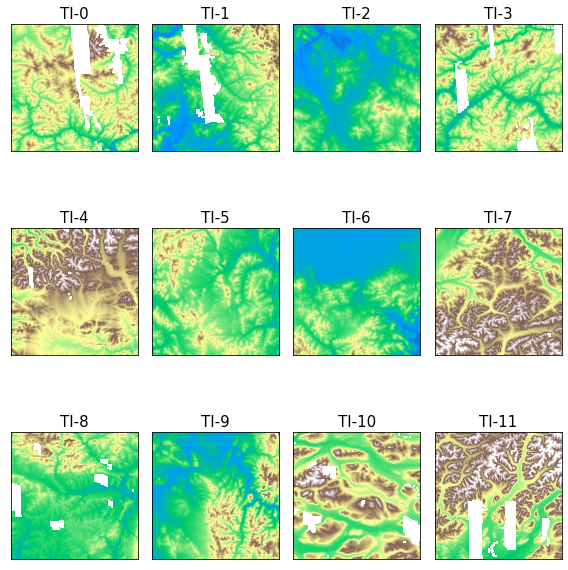

In [13]:
print('Examples of TIs')
plt.figure(figsize=(8,9))
for i in range(12):
    plt.subplot(3,4, i+1)
    pltdata = TrainingImages[i].reshape(200,200)
    pltdata[pltdata<=-9999] = np.nan
    plt.imshow(pltdata, cmap='terrain', vmax=1800, vmin=0)
#     plt.colorbar(fraction=0.02)
#     plt.title('TI-'+str(i+60), fontsize=15)
    plt.title('TI-'+str(i), fontsize=15)
    plt.xticks([]), plt.yticks([])
plt.tight_layout()

In [8]:
def Standardization_MinMaxScaler(Image, LowerBound, TI_Height, TI_Width):
    InvestigatedImage = np.copy(Image).reshape(-1)
    
    AvailableLocation = np.argwhere(InvestigatedImage > LowerBound).reshape(-1)
    RegionOfInterest = InvestigatedImage[InvestigatedImage>LowerBound]
    
    elevation_min = np.min(RegionOfInterest)
    elevation_max = np.max(RegionOfInterest)
    
    InvestigatedImage[AvailableLocation] = np.copy( (RegionOfInterest - elevation_min)/(elevation_max - elevation_min) )
    InvestigatedImage = InvestigatedImage.reshape((TI_Height, TI_Width))
    
#     plt.imshow(Image,vmin=elevation_min,vmax=elevation_max,cmap='jet')
#     plt.colorbar()
#     plt.title(f'Original Training Image')
#     plt.show()

    plt.imshow(InvestigatedImage,vmin=0,vmax=1,cmap='terrain')
    plt.colorbar()
    plt.title(f'Training Image After Standardization')
    plt.show()

    return np.copy(InvestigatedImage), elevation_min, elevation_max

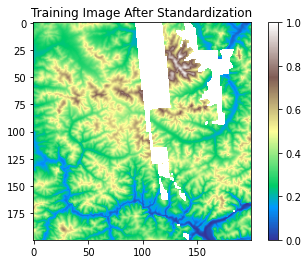

Training Image 1


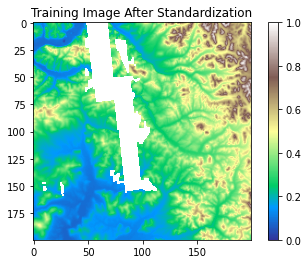

Training Image 2


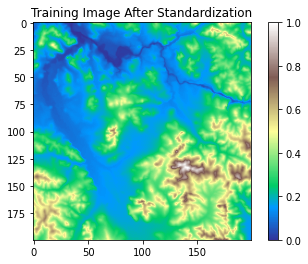

Training Image 3


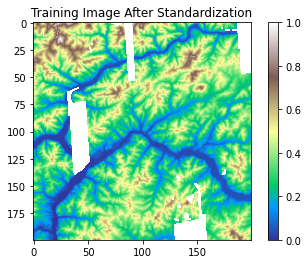

Training Image 4


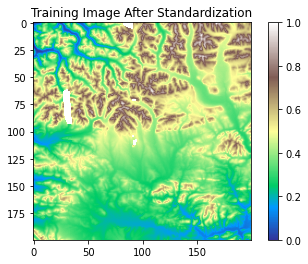

Training Image 5


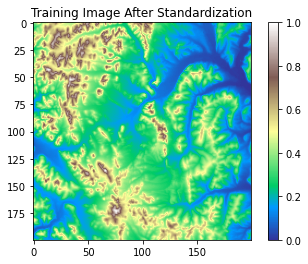

Training Image 6


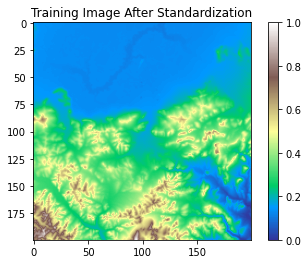

Training Image 7


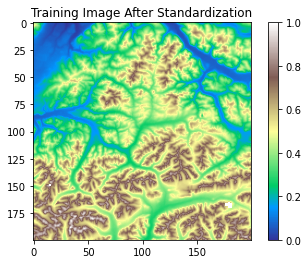

Training Image 8


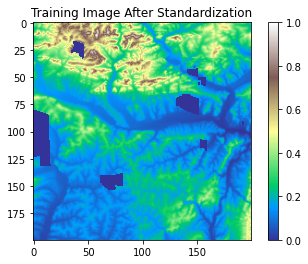

Training Image 9


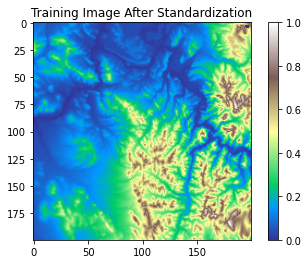

Training Image 10


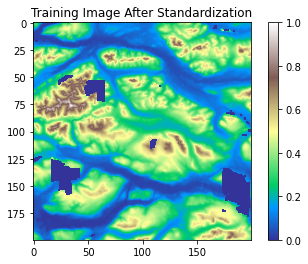

Training Image 11


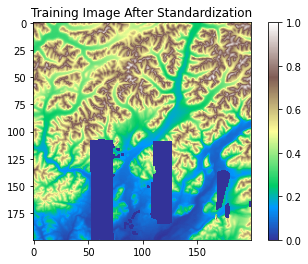

Training Image 12


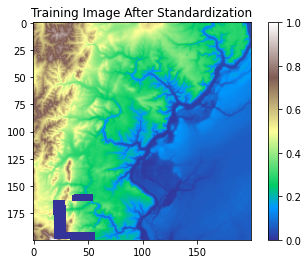

Training Image 13


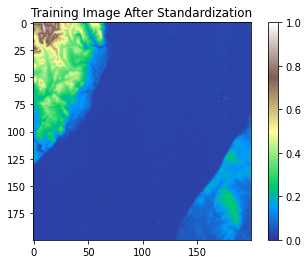

Training Image 14


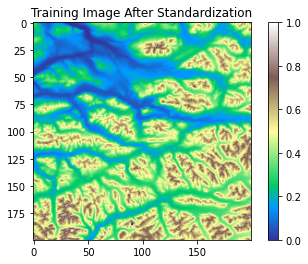

Training Image 15


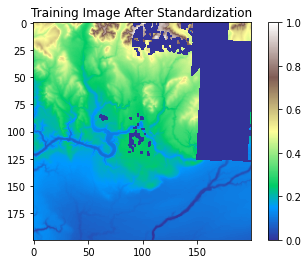

Training Image 16


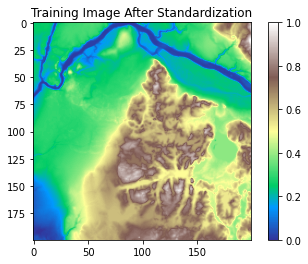

Training Image 17


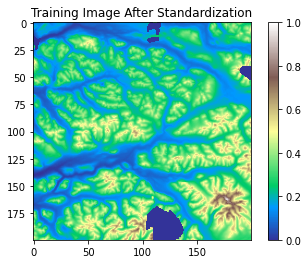

Training Image 18


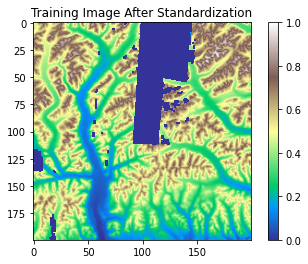

Training Image 19


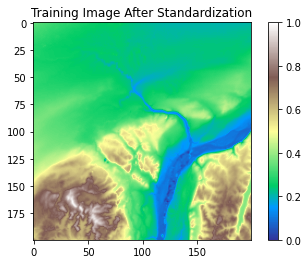

Training Image 20


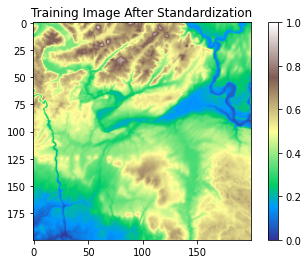

Training Image 21


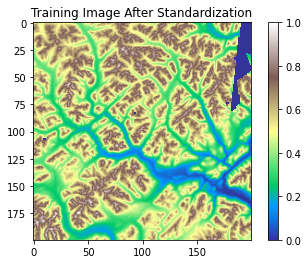

Training Image 22


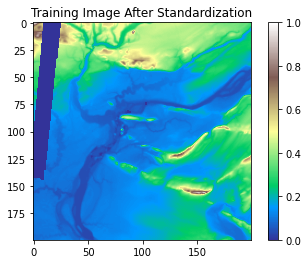

Training Image 23


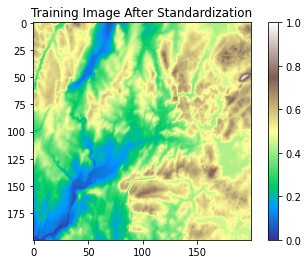

Training Image 24


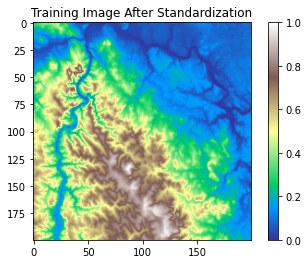

Training Image 25


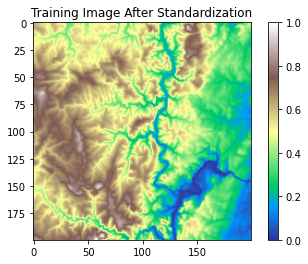

Training Image 26


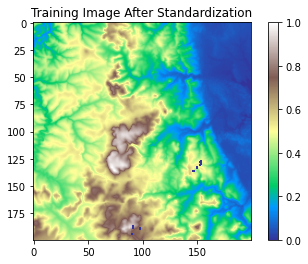

Training Image 27


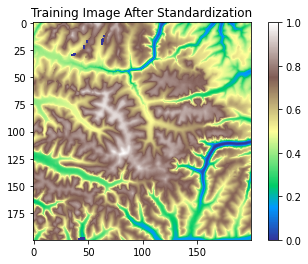

Training Image 28


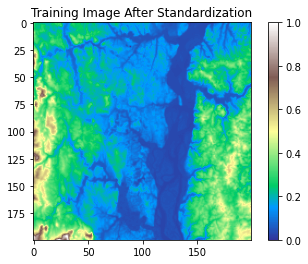

Training Image 29


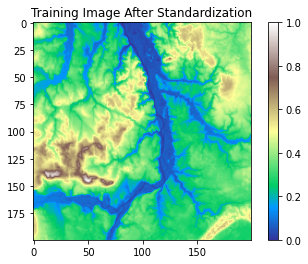

Training Image 30


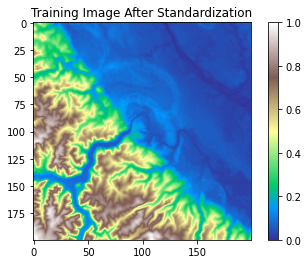

Training Image 31


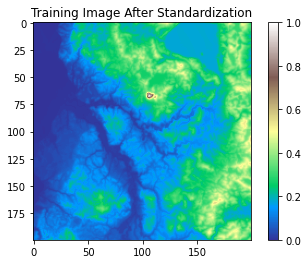

Training Image 32


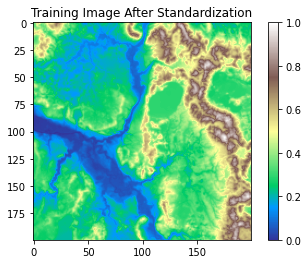

Training Image 33


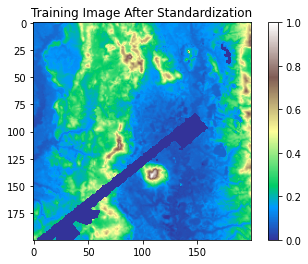

Training Image 34


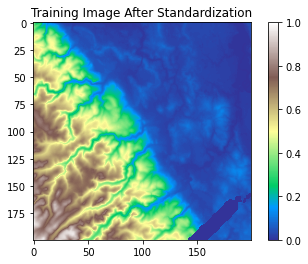

Training Image 35


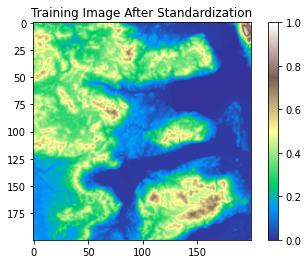

Training Image 36


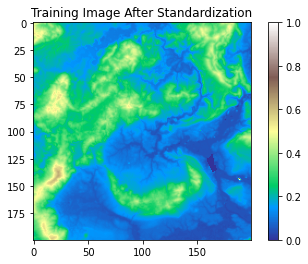

Training Image 37


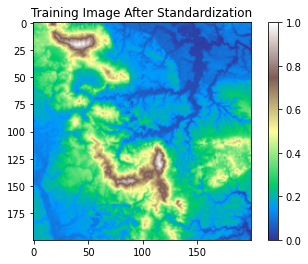

Training Image 38


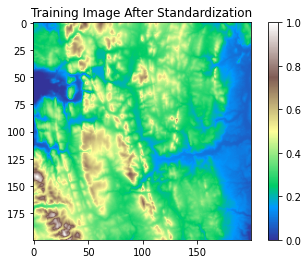

Training Image 39


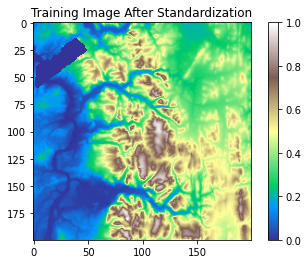

Training Image 40


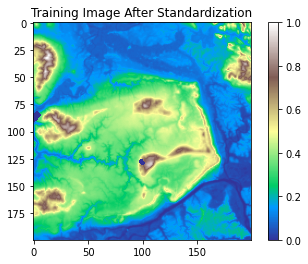

Training Image 41


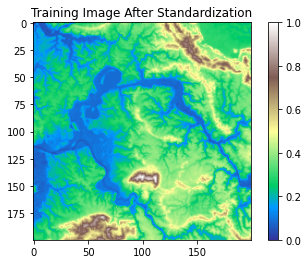

Training Image 42


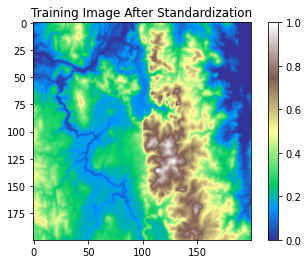

Training Image 43


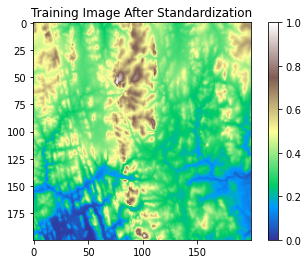

Training Image 44


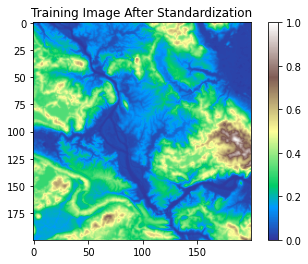

Training Image 45


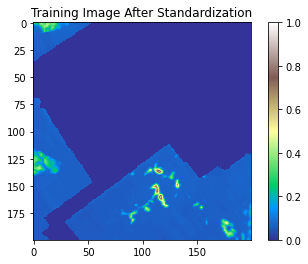

Training Image 46


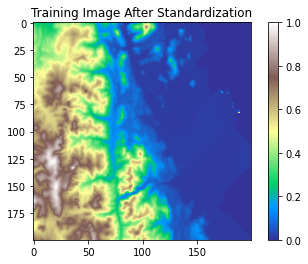

Training Image 47


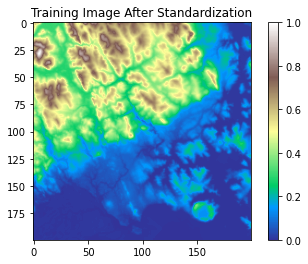

Training Image 48


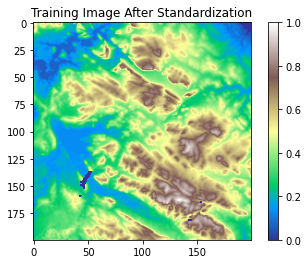

Training Image 49


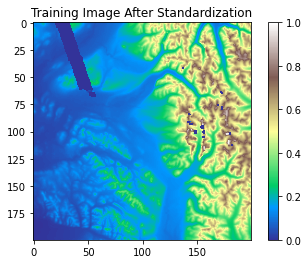

Training Image 50


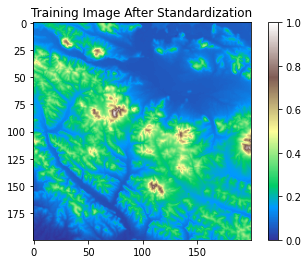

Training Image 51


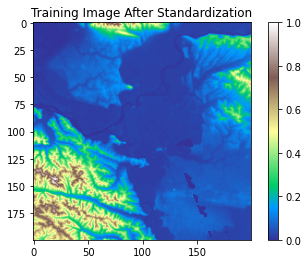

Training Image 52


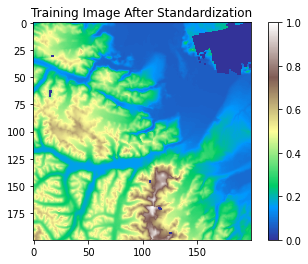

Training Image 53


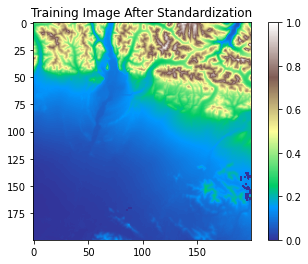

Training Image 54


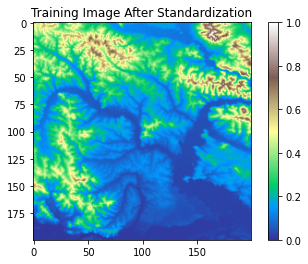

Training Image 55


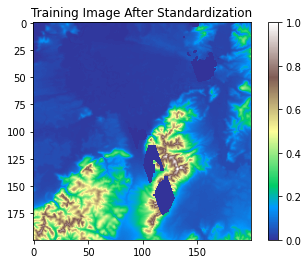

Training Image 56


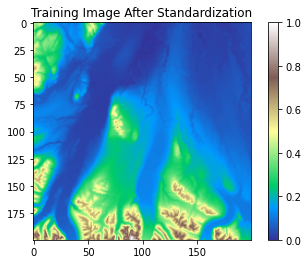

Training Image 57


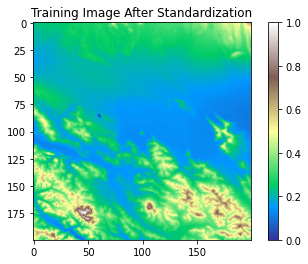

Training Image 58


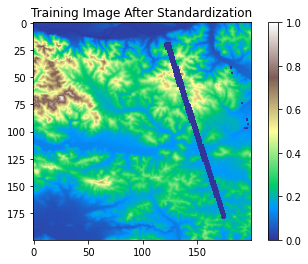

Training Image 59


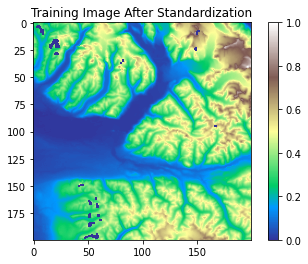

Training Image 60


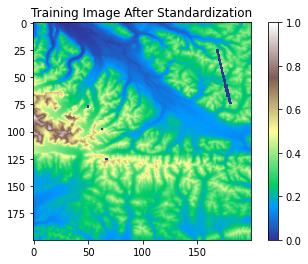

Training Image 61


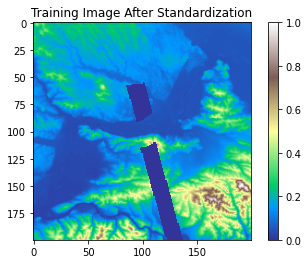

Training Image 62


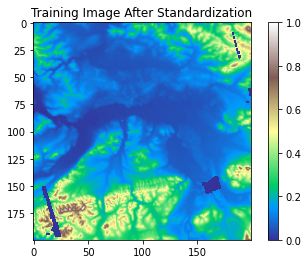

Training Image 63


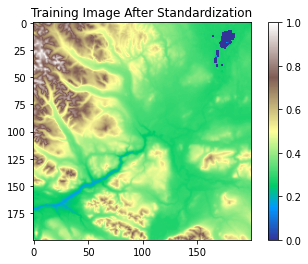

Training Image 64


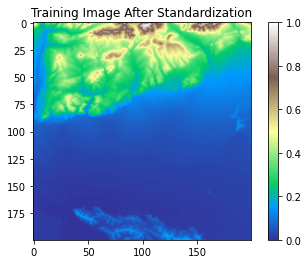

Training Image 65


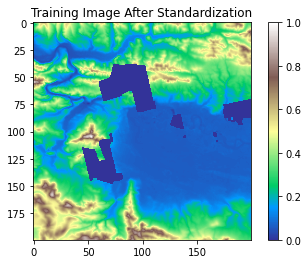

Training Image 66


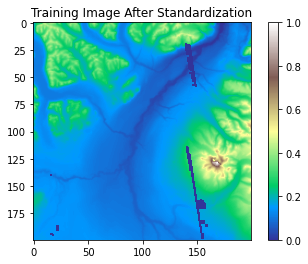

Training Image 67


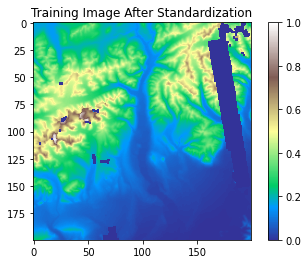

Training Image 68


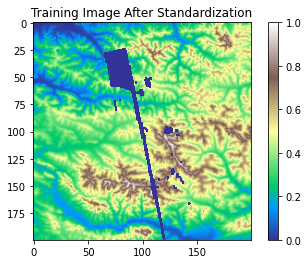

Training Image 69


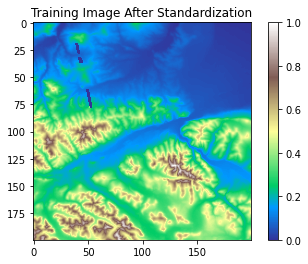

Training Image 70


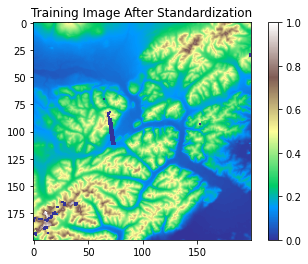

Training Image 71


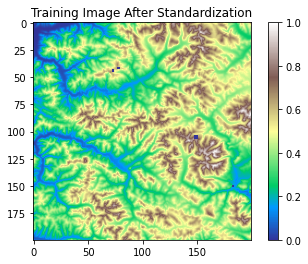

Training Image 72


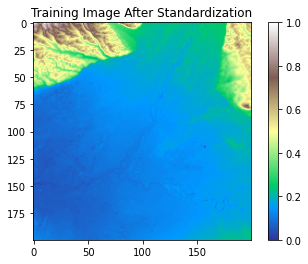

Training Image 73


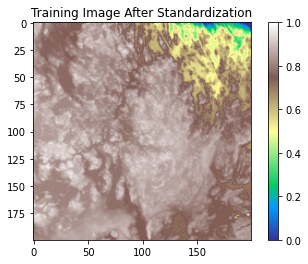

Training Image 74


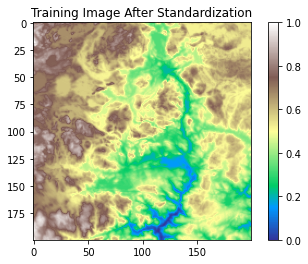

Training Image 75


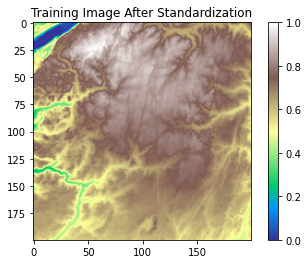

Training Image 76


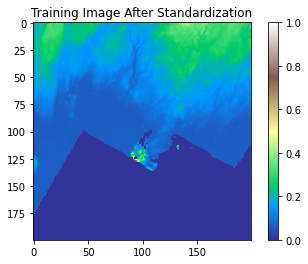

Training Image 77


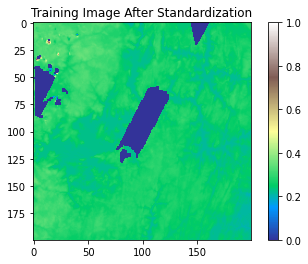

Training Image 78


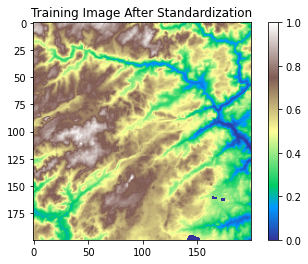

Training Image 79


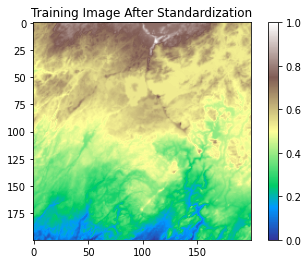

Training Image 80


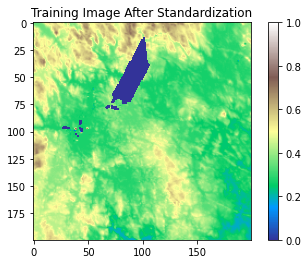

Training Image 81


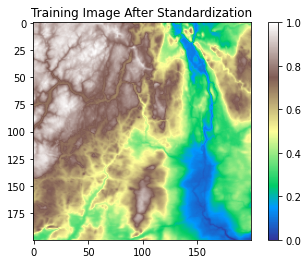

Training Image 82


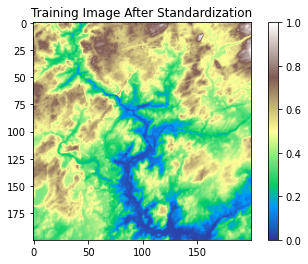

Training Image 83


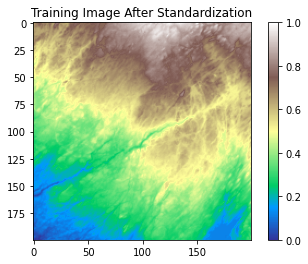

Training Image 84


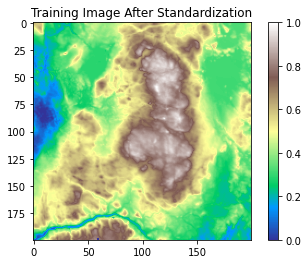

Training Image 85


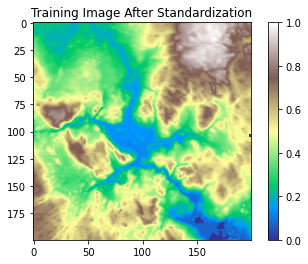

Training Image 86


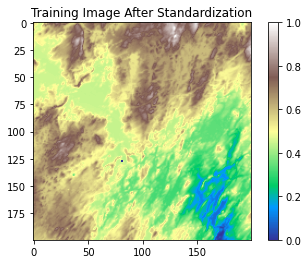

Training Image 87


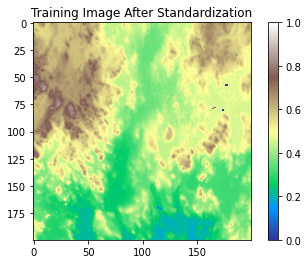

Training Image 88


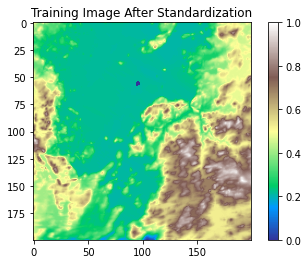

Training Image 89


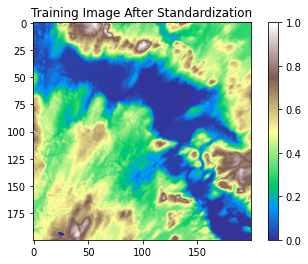

Training Image 90


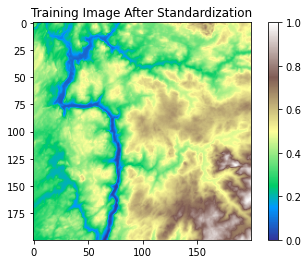

Training Image 91


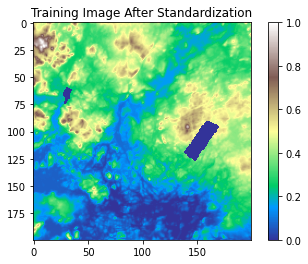

Training Image 92


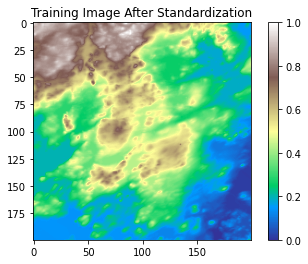

Training Image 93


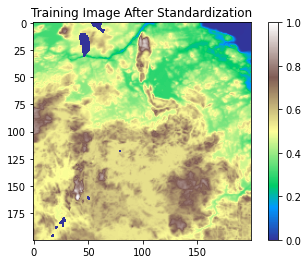

Training Image 94


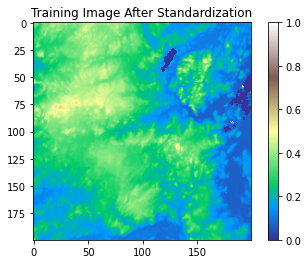

Training Image 95


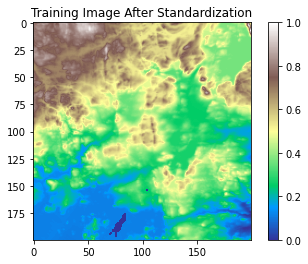

Training Image 96


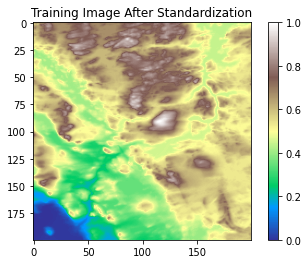

Training Image 97


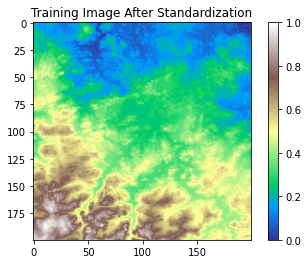

Training Image 98


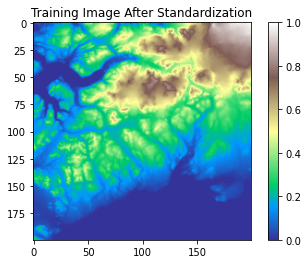

Training Image 99


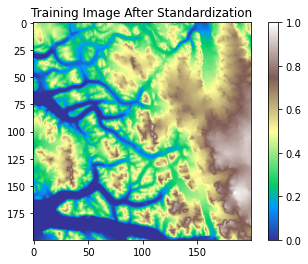

Training Image 100


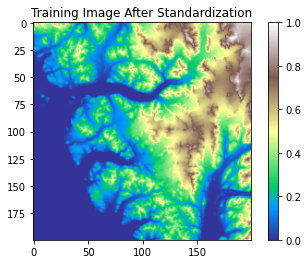

Training Image 101


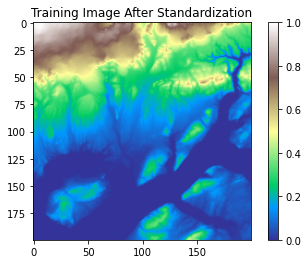

Training Image 102


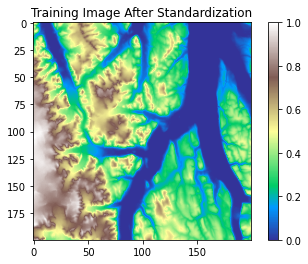

Training Image 103


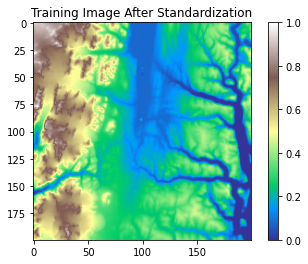

Training Image 104


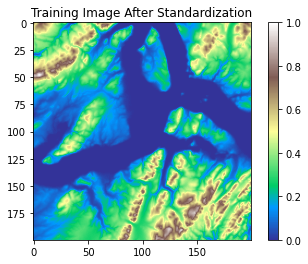

Training Image 105


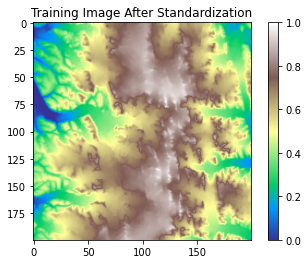

Training Image 106


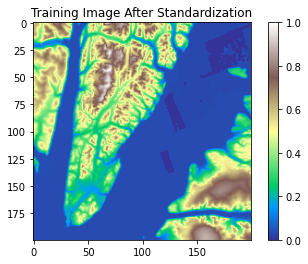

Training Image 107


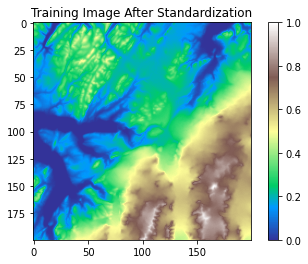

Training Image 108


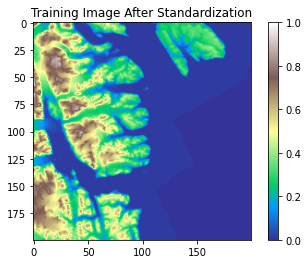

Training Image 109


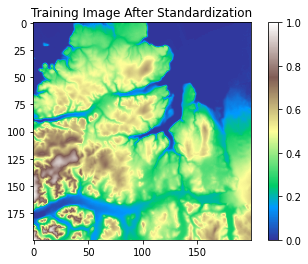

Training Image 110


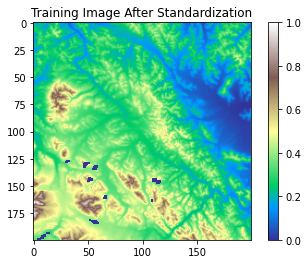

Training Image 111


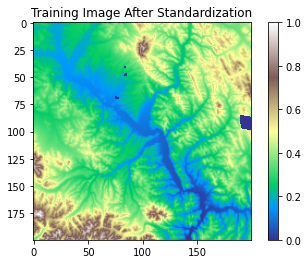

Training Image 112


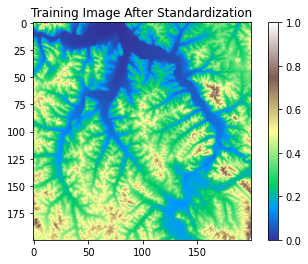

Training Image 113


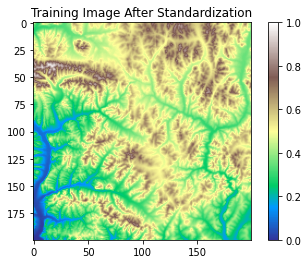

Training Image 114


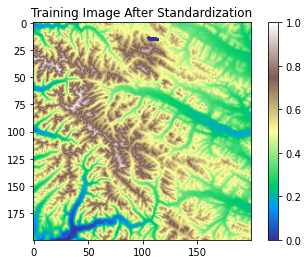

Training Image 115


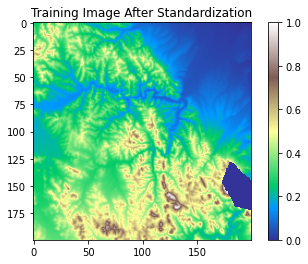

Training Image 116


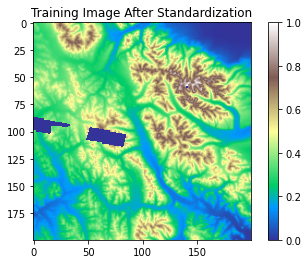

Training Image 117


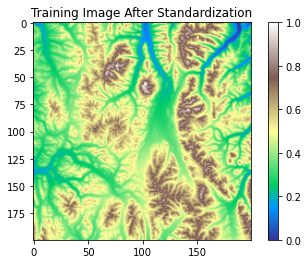

Training Image 118


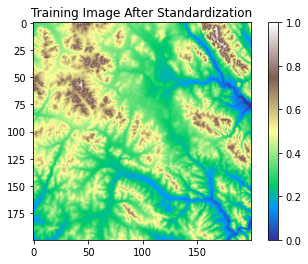

Training Image 119


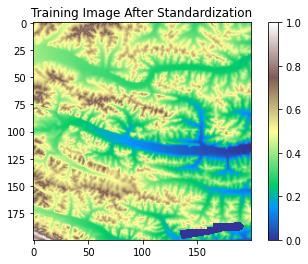

Training Image 120


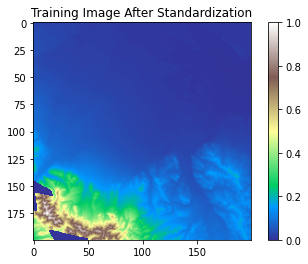

Training Image 121


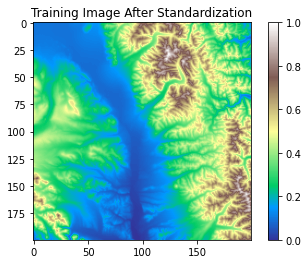

Training Image 122


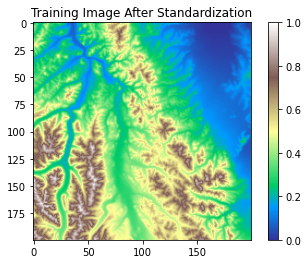

Training Image 123


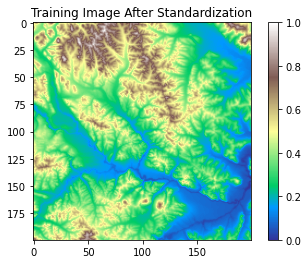

Training Image 124


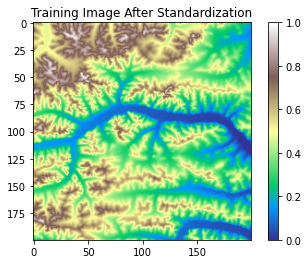

Training Image 125


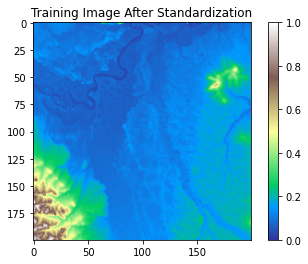

Training Image 126


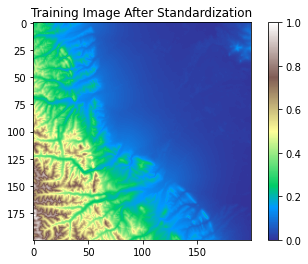

Training Image 127


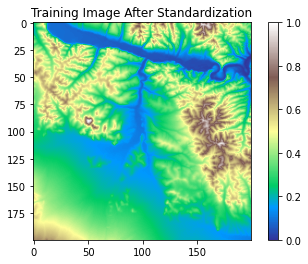

Training Image 128


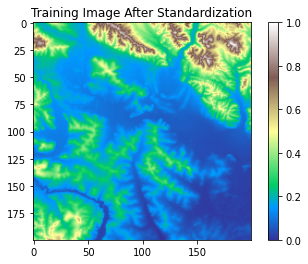

Training Image 129


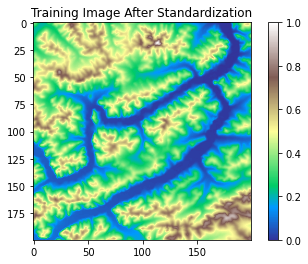

Training Image 130


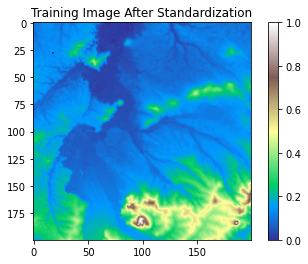

Training Image 131


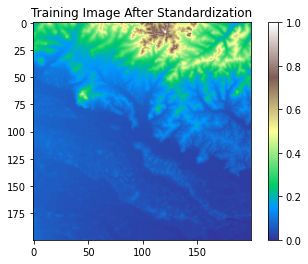

Training Image 132


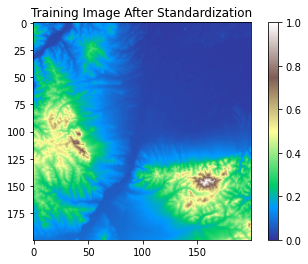

Training Image 133


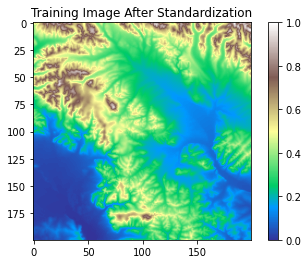

Training Image 134


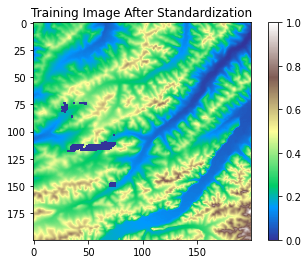

Training Image 135


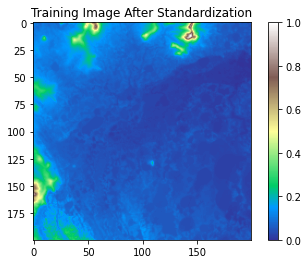

Training Image 136


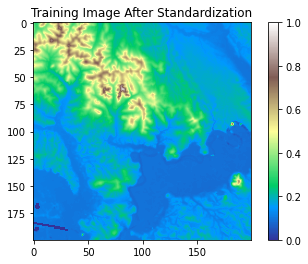

Training Image 137


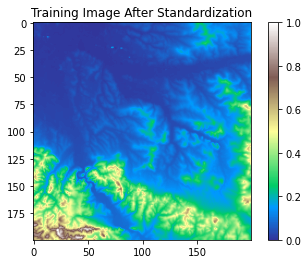

Training Image 138


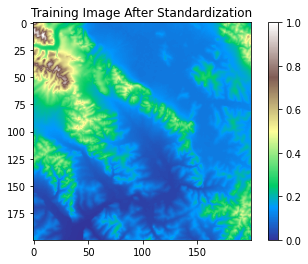

Training Image 139


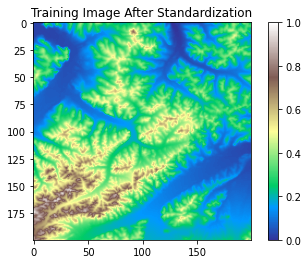

Training Image 140


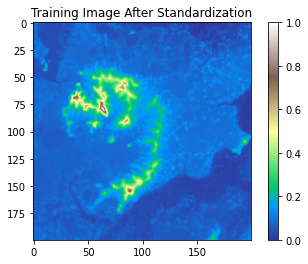

Training Image 141


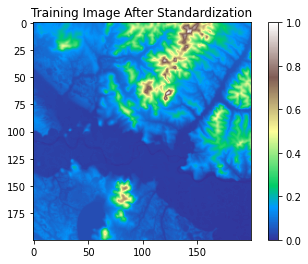

Training Image 142


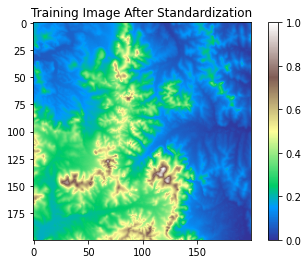

Training Image 143


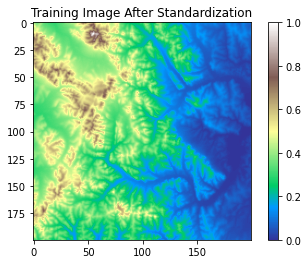

Training Image 144


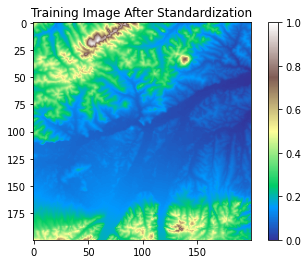

Training Image 145


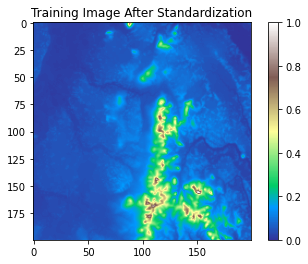

Training Image 146


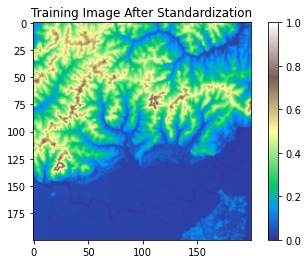

Training Image 147


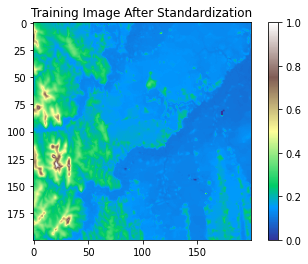

Training Image 148


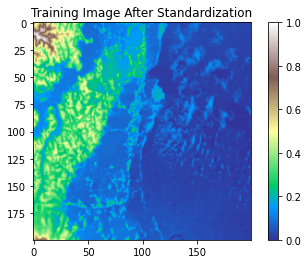

Training Image 149


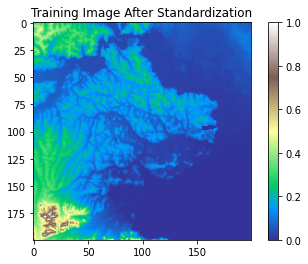

Training Image 150


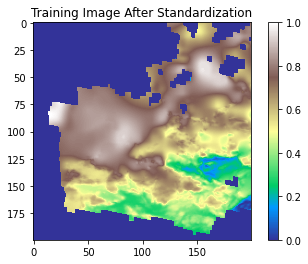

Training Image 151


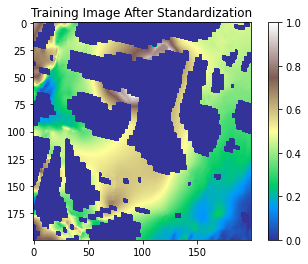

Training Image 152


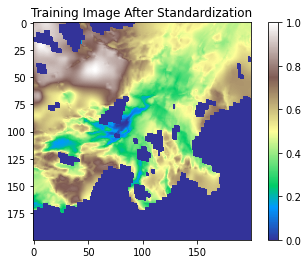

Training Image 153


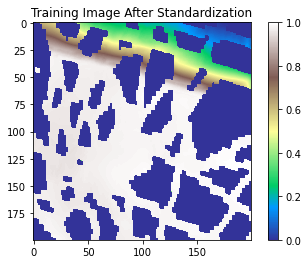

Training Image 154


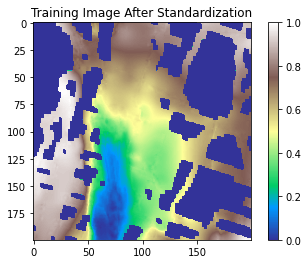

Training Image 155


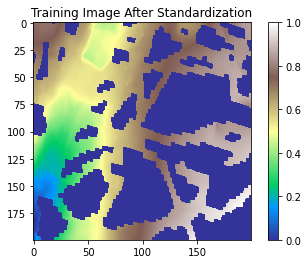

Training Image 156


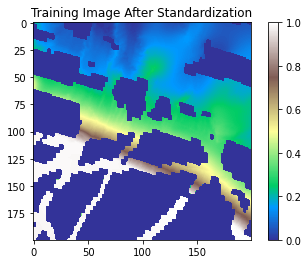

Training Image 157


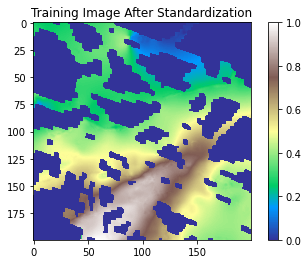

Training Image 158


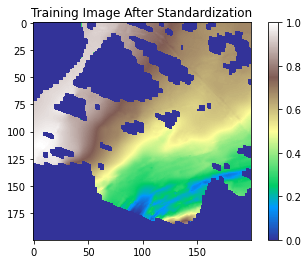

Training Image 159


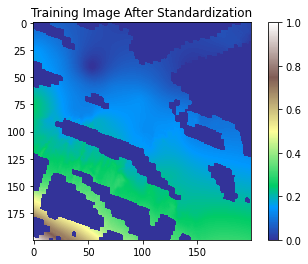

Training Image 160


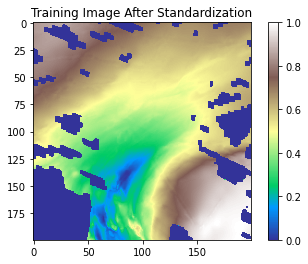

Training Image 161


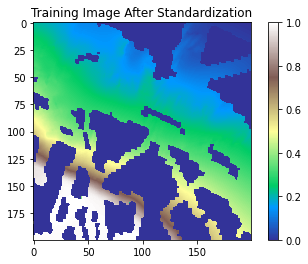

Training Image 162


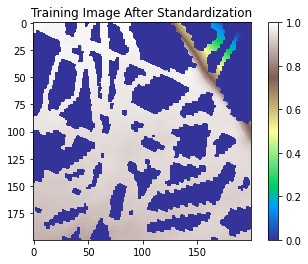

Training Image 163


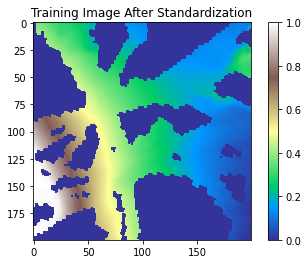

Training Image 164


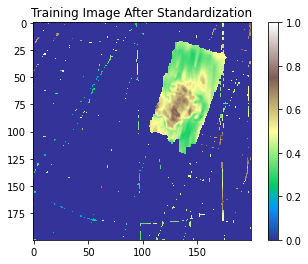

Training Image 165


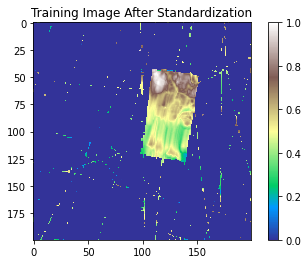

In [11]:
Elevation_minValues = []
Elevation_maxValues = []

TrainingImages_standard, elevation_min, elevation_max = Standardization_MinMaxScaler(Image=TrainingImages[0],
                                                                                       LowerBound=LowerBound,
                                                                                       TI_Height=TI_Height,
                                                                                       TI_Width=TI_Width)
Elevation_minValues.append(elevation_min)
Elevation_maxValues.append(elevation_max)
TrainingImages_standard = TrainingImages_standard.reshape((1,TI_Height,TI_Width))

for index_TI in range(1,TI_Amount):
    print(f'Training Image {index_TI}')
    standardization, elevation_min, elevation_max = Standardization_MinMaxScaler(Image=TrainingImages[index_TI],
                                                                       LowerBound=LowerBound,
                                                                       TI_Height=TI_Height,
                                                                       TI_Width=TI_Width)
    
    Elevation_minValues.append(elevation_min)
    Elevation_maxValues.append(elevation_max)
    
    standardization = standardization.reshape((1,TI_Height,TI_Width))
    TrainingImages_standard = np.concatenate((TrainingImages_standard, standardization),axis=0)
    
Elevation_minValues = np.array(Elevation_minValues)
Elevation_maxValues = np.array(Elevation_maxValues)

TrainingImages_standard_list = TrainingImages_standard.tolist()

# np.savetxt(fname='TI_Standardization_166.txt',X=TrainingImages_standard0.reshape((1,-1)),fmt='%.6f',delimiter=',')

In [21]:
def Construct_PatternDataset(TI, TI_height, TI_width, template_radius):
    '''extract patterns with a stride from a training image'''
#     print('construct pattern set')
    patternSize = (2*template_radius + 1)*(2*template_radius+1)
    
    patternAmount = 0
    Location_y = []
    Location_x = []
    
    LowerBound = -9998
    Stride = 2
    
    test_y = np.arange(start=template_radius, stop=TI_height-template_radius, step=Stride)
    test_y = test_y.tolist()
    test_x = np.arange(start=template_radius, stop=TI_height-template_radius, step=Stride)
    test_x = test_x.tolist()
    
    for location_y in test_y:
        for location_x in test_x:
            pattern = np.copy(TI[location_y-template_radius:location_y+template_radius+1,
                                       location_x-template_radius:location_x+template_radius+1])
            pattern = pattern.reshape(-1)
            if(np.argwhere(pattern < LowerBound).shape[0] > 0):
                continue
            else:
                patternAmount += 1
                Location_y.append(location_y)
                Location_x.append(location_x)
                
    PatternDataset = np.zeros((patternAmount, patternSize))
    
    pattern_index = 0
    for location_y, location_x  in zip(Location_y, Location_x):
        pattern = np.copy(TI[location_y-template_radius:location_y+template_radius+1,
                              location_x-template_radius:location_x+template_radius+1])
        pattern = pattern.reshape(-1)
        PatternDataset[pattern_index] = np.copy(pattern)
        pattern_index += 1
    
    '''very important notice'''
    '''multi-dimension slicing in python list is not easy'''
    '''use numpy array to achieve multi-dimension slice'''
            
    return PatternDataset, patternAmount, patternSize, Location_y, Location_x

In [10]:
def Clustering_AgglomerativeClustering(PatternSet,DistanceThreshold):
    '''perform agglomerative clustering on a given set'''
#     print('perform clustering')
    
#     LinkageType = 'complete'
    LinkageType = 'average'
    
    clusteringProgram = AgglomerativeClustering(n_clusters=None, 
                                                 affinity='euclidean', 
                                                 connectivity=None,
                                                 linkage=LinkageType,
                                                 distance_threshold = DistanceThreshold).fit(PatternSet)
    
    labels = clusteringProgram.labels_
    clusterAmount = clusteringProgram.n_clusters_
    
    cluster_member_Amount = np.zeros(clusterAmount)
    for index_cluster in range(clusterAmount):
        member_amount = np.argwhere(labels==index_cluster).shape[0]
        cluster_member_Amount[index_cluster] = member_amount
    
#     print(f'the number of clusters is {clusterAmount}')
    
    return clusterAmount, labels, cluster_member_Amount

In [11]:
def Find_Medoids_From_PatternSet(PatternSet, Cluster_Amount, Cluster_labels):
    '''medoid is the center of each cluster. Medoid is the real vector while centroid is not.'''
#     print('find medoids')
    if(Cluster_Amount < 2):
        centroids = np.mean(PatternSet,axis=0)
    else:
        centroidProgram =  NearestCentroid().fit(PatternSet, Cluster_labels)
        centroids =  centroidProgram.centroids_  # centroid is the mean value
        # shape of centroid matrix is (n_classes,n_features)
        
    medoid_Index = np.empty(Cluster_Amount)
    for cluster_index in range(Cluster_Amount):
        memberPattern_Index = np.argwhere(Cluster_labels==cluster_index).reshape(-1)
        memberPattern = PatternSet[ memberPattern_Index, : ]
        memberPattern_Amount = memberPattern.shape[0]
        
        distanceSet = np.empty(memberPattern_Amount)
        
        for member_Index in range(memberPattern_Amount):
            distance_member_centroid = euclidean(memberPattern[member_Index],centroids[cluster_index])
            distanceSet[member_Index] = distance_member_centroid
        medoid_Index[cluster_index] = memberPattern_Index[ np.argmin(distanceSet) ] 
        
    return medoid_Index.astype(int)

In [12]:
def Draw_RepresentativePattern(Representatives, TemplateRadius, Cluster_Amount):
    '''Plot the representative patterns'''
#     print('find representatives')
    TemplateLength = 2*TemplateRadius+1
    
    for cluster_index in range(Cluster_Amount):
        representative = Representatives[cluster_index].reshape((TemplateLength,TemplateLength))
        plt.imshow(representative,cmap='jet')
        plt.colorbar()
        plt.title(f'Representative Pattern {cluster_index}')
        plt.show()
        
    return

In [13]:
def Store_Representatives_BasicInformation(fileName,TI_Amount,Representative_OverallAmount,Template_radius):
    '''store basic information in a txt file'''
    file_basic = open(fileName,'w')
    file_basic.write(f'TI_Amount: {TI_Amount}\n')
    file_basic.write(f'Representative amount: {Representative_OverallAmount}\n')
    file_basic.write(f'Template radius: {Template_radius}\n')
    file_basic.write(f'The shape of one representative pattern is {2*Template_radius+1}*{2*Template_radius+1}')
    file_basic.close()
    return

In [14]:
def Store_Representatives_AmountPerTI(fileName,Cluster_Amounts):
    np.savetxt(fname=fileName,X=Cluster_Amounts.reshape((1,-1)),fmt='%d',delimiter=',')
    return

In [15]:
def Store_Representatives(fileName,Representatives_1D):
    np.savetxt(fname=fileName,X=Representatives_1D.reshape((1,-1)),fmt='%d',delimiter=',')
    return

In [16]:
def Store_Representatives_Locations(fileName,Locations_y,Locations_x):
    locations = []
    for  y, x in zip(Locations_y, Locations_x):
        locations.append(y)
        locations.append(x)
    locations = np.array(locations)
    np.savetxt(fname=fileName,X=locations.reshape((1,-1)),fmt='%d',delimiter=',')
    return

In [17]:
def Store_Representatives_MemberAmount(fileName,Cluster_member_Amount):
    np.savetxt(fname=fileName,X=Cluster_member_Amount.reshape((1,-1)),fmt='%d',delimiter=',')
    return

In [18]:
def Find_Representatives_From_TrainingImage_Medoids(TI, TI_height, TI_width, TemplateRadius, DistanceThreshold):
    '''find centroid pattern from a training image'''
    
    #construct a pattern dataset
    PatternDataset, patternAmount, patternSize, Locations_y, Locations_x = Construct_PatternDataset(TI = TI,
                                                                                                    TI_height = TI_height,
                                                                                                    TI_width = TI_width,
                                                                                                    template_radius = TemplateRadius)
    
    # directly carry out agglomerative clustering on training patterns
    Cluster_Amount, Cluster_labels, Cluster_member_Amount = Clustering_AgglomerativeClustering(PatternSet = PatternDataset,
                                                                       DistanceThreshold=DistanceThreshold)
    
    # find medoid patterns
    Medoid_Index =  Find_Medoids_From_PatternSet(PatternSet=PatternDataset,
                                                     Cluster_Amount=Cluster_Amount, 
                                                     Cluster_labels=Cluster_labels)
    # find representatives according to index
    Representatives_1D = PatternDataset[ Medoid_Index, : ]
    Locations_y_array = np.array(Locations_y)
    Locations_x_array = np.array(Locations_x)
    Representatives_location_y = Locations_y_array[ Medoid_Index ]
    Representatives_location_x = Locations_x_array[ Medoid_Index ]
    # the shape of this matrix is (n_representative, n_dimension)
    
    # plot the representative patterns
#     Draw_RepresentativePattern(Representatives = Representatives_1D,
#                                TemplateRadius = TemplateRadius,
#                                Cluster_Amount = Cluster_Amount)
    
    return Cluster_Amount, Representatives_1D.reshape(-1),Representatives_location_y, Representatives_location_x, Cluster_member_Amount

In [19]:
def MainFunction_Medoids(TemplateRadius, TI_Amount, TrainingImages, TI_Height,TI_Width, DistanceThreshold):
    '''extract representatives'''
    '''Medoid pattern is recorded'''
    '''Centroid is the mean. Medoid is the actual vector closest to centroid'''
    
    TemplateLength = 2*TemplateRadius+1

    Representatives_Amount = np.zeros(TI_Amount,dtype=int)         # the number of representative patterns in TI
    Representatives_Patterns = np.zeros(0)  # the actual representative patterns
    Representatives_Location_y = np.zeros(0)
    Representatives_Location_x = np.zeros(0)
    Representatives_MemberAmount = np.zeros(0)   # the number of member pattern in each clusters

    for index_TI in range(TI_Amount):
        print(f'Training image {index_TI}')
        cluster_Amount, representativePatterns, location_y, location_x, representative_memberAmount = Find_Representatives_From_TrainingImage_Medoids(TI= TrainingImages[index_TI],
                                                                                                                          TI_height = TI_Height,
                                                                                                                          TI_width = TI_Width,
                                                                                                                          TemplateRadius = TemplateRadius,
                                                                                                                          DistanceThreshold=DistanceThreshold)


        Representatives_Amount[index_TI] = cluster_Amount
        Representatives_Patterns = np.concatenate((Representatives_Patterns, representativePatterns))
        Representatives_Location_y = np.concatenate((Representatives_Location_y, location_y))
        Representatives_Location_x = np.concatenate((Representatives_Location_x, location_x))
        Representatives_MemberAmount = np.concatenate((Representatives_MemberAmount, representative_memberAmount))

#         print(f'There are {cluster_Amount} clusters in this training image')
        
    #store representative nomination result
    Store_Representatives_BasicInformation(fileName='Representatives_BasicInformation.txt',
                                           TI_Amount = TI_Amount,
                                           Representative_OverallAmount = np.sum(Representatives_Amount),
                                           Template_radius = TemplateRadius)
    Store_Representatives_AmountPerTI(fileName='Representatives_ClusterAmount.txt',
                                      Cluster_Amounts = Representatives_Amount)
    Store_Representatives(fileName='Representatives_RealRepresentatives.txt',
                          Representatives_1D = Representatives_Patterns)
    Store_Representatives_Locations(fileName = 'Representatives_Locations.txt',
                                    Locations_y = Representatives_Location_y,
                                    Locations_x = Representatives_Location_x)
    Store_Representatives_MemberAmount(fileName = 'Representatives_MemberAmount.txt',
                                       Cluster_member_Amount = Representatives_MemberAmount)
    return

In [22]:
'''Main function'''

TemplateRadius = 5
DistanceThreshold = 0.15 * np.sqrt((2*TemplateRadius+1) * (2*TemplateRadius+1))

# find representative patterns from standardized TI
MainFunction_Medoids(TemplateRadius = TemplateRadius,
                     TI_Amount = TI_Amount, 
                     TrainingImages = TrainingImages_standard,
                     TI_Height = TI_Height,
                     TI_Width = TI_Width, 
                     DistanceThreshold=DistanceThreshold)

Training image 0
Training image 1
Training image 2
Training image 3
Training image 4
Training image 5
Training image 6
Training image 7
Training image 8
Training image 9
Training image 10
Training image 11
Training image 12
Training image 13
Training image 14
Training image 15
Training image 16
Training image 17
Training image 18
Training image 19
Training image 20
Training image 21
Training image 22
Training image 23
Training image 24
Training image 25
Training image 26
Training image 27
Training image 28
Training image 29
Training image 30
Training image 31
Training image 32
Training image 33
Training image 34
Training image 35
Training image 36
Training image 37
Training image 38
Training image 39
Training image 40
Training image 41
Training image 42
Training image 43
Training image 44
Training image 45
Training image 46
Training image 47
Training image 48
Training image 49
Training image 50
Training image 51
Training image 52
Training image 53
Training image 54
Training image 55
Tr